In [107]:
pwd

'/Users/brettlv/blog/brettlv.github.io/pythoncode/Bfraction_1'

In [7]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
#%config InlineBackend.figure_format='retina'

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.stats import LombScargle
plt.style.use('seaborn-whitegrid')

from scipy import integrate
import astropy
from astropy.time import Time

import pyfits
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.stats import LombScargle
import matplotlib.ticker as ticker

In [2]:
import os
from matplotlib import animation

In [102]:
11605*64,300/0.026*64

(742720, 738461.5384615385)

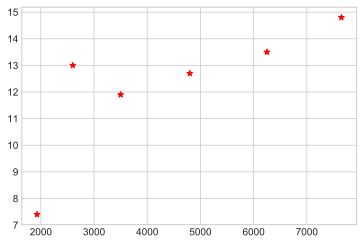

In [9]:
wavelength=[3500,4800,6250,7650,2600,1928]
fraction=[11.9,12.7,13.5,14.8,13,7.4]
k=1.38*10**-23#J/K
h=6.626*10**-34#J*s
c=3*10**8#m
#1ev~11605K
plt.scatter(wavelength,fraction,color='r',marker="*")

In [95]:
T1=np.array([27000,32400,50000,100000,150000,200000,300000,500000,600000,700000,740000])
q=np.arange(20)*0.02+0.1
waveA=np.linspace(1000,8000,1000)
lamdawave=waveA*10**-10

path='/Users/brettlv/blog/brettlv.github.io/pythoncode/Bfraction_1'
#os.mkdir("Bfraction")
isExists = os.path.exists(path)
if not isExists:
    os.makedirs(path)
os.chdir(path)       

In [110]:
pwd

'/Users/brettlv/blog/brettlv.github.io/pythoncode/Bfraction_1'

In [97]:
T1,q

(array([ 27000,  32400,  50000, 100000, 150000, 200000, 300000, 500000,
        600000, 700000, 740000]),
 array([ 0.1 ,  0.12,  0.14,  0.16,  0.18,  0.2 ,  0.22,  0.24,  0.26,
         0.28,  0.3 ,  0.32,  0.34,  0.36,  0.38,  0.4 ,  0.42,  0.44,
         0.46,  0.48]))

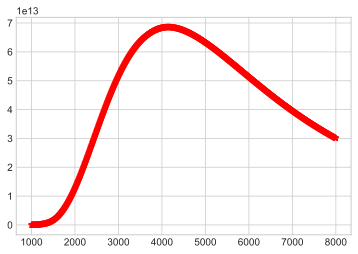

In [12]:
def Blamda(lamdawave,Tirr):
    blamda=2*h*c**2*lamdawave**(-5)*(np.e**(h*c/lamdawave/k/Tirr)-1)**-1
    return blamda

waveA=np.linspace(1000,8000,1000)
lamdawave=waveA*10**-10
blamdaA=Blamda(lamdawave,7000)

plt.scatter(waveA,blamdaA,color='r',marker="*")


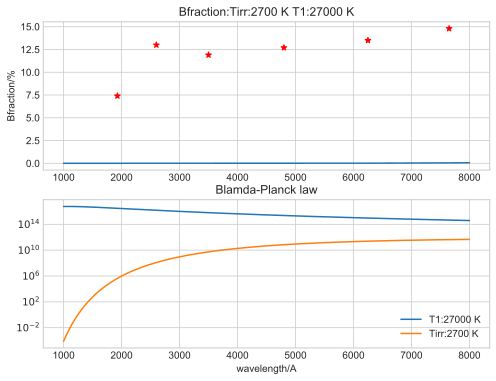

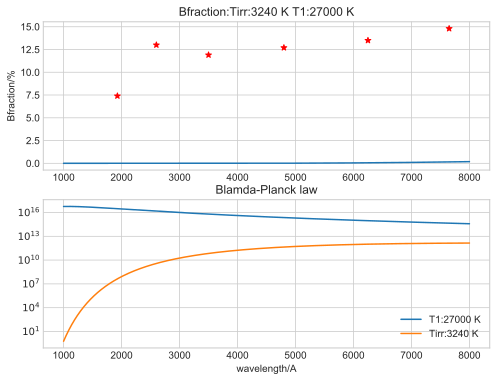

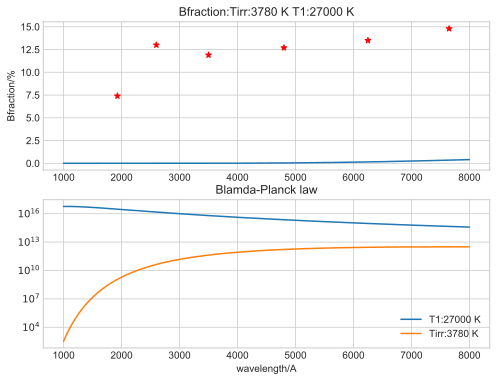

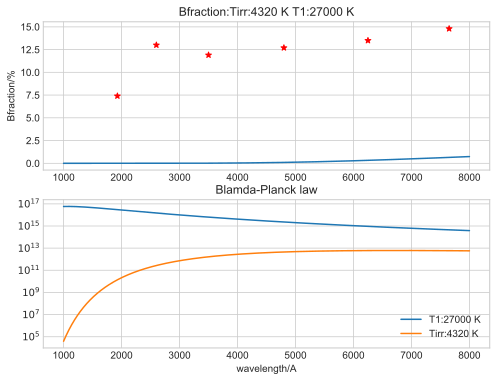

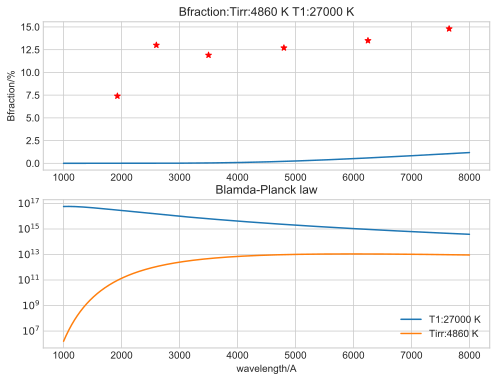

...

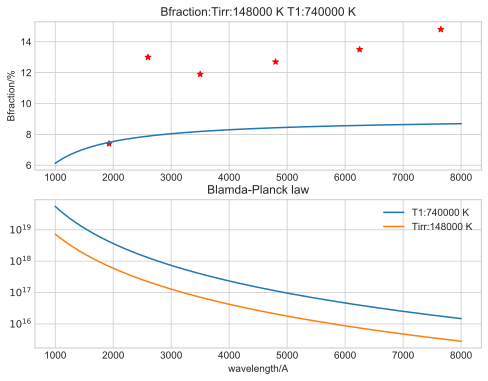

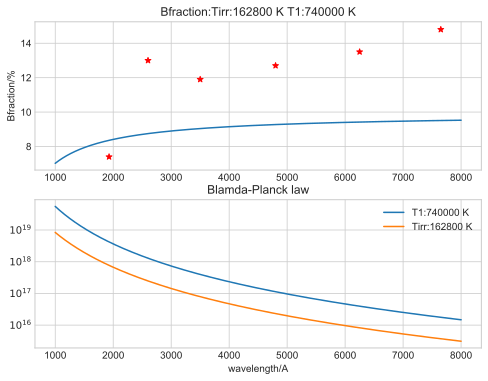

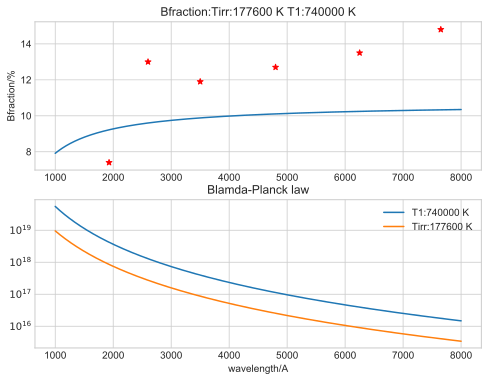

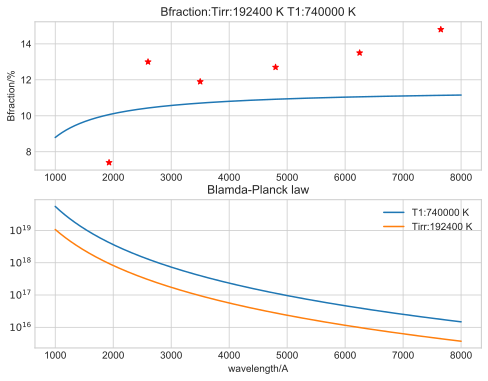

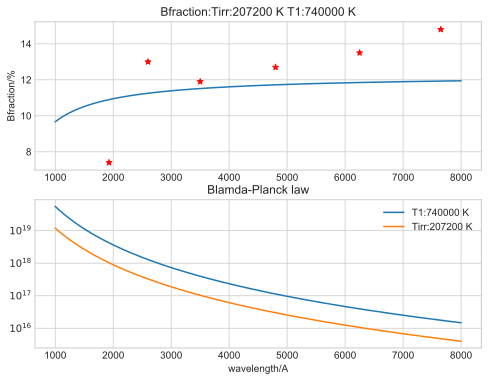

In [ ]:
def Blamda(lamdawave,Tirr):
    blamda=2*h*c**2*lamdawave**(-5)*(np.e**(h*c/lamdawave/k/Tirr)-1)**-1
    return blamda

for T1_ in T1:
    for q_ in q:
        Tirr_=q_*T1_
        rate=0.5*Blamda(lamdawave,Tirr_)/(Blamda(lamdawave,T1_)+0.5*Blamda(lamdawave,Tirr_))
        fig = plt.figure(figsize=(8,6))
        ax1=fig.add_subplot(2,1,1)      
        ax1.set_title('Bfraction:Tirr:%d K T1:%d K'%(Tirr_,T1_))
        ax1.plot(waveA,rate*100)
        ax1.scatter(wavelength,fraction,color='r',marker="*")

        ax1.set_ylabel("Bfraction/%")
        ax2=fig.add_subplot(2,1,2)
        ax2.set_title("Blamda-Planck law")
        ax2.plot(waveA,Blamda(lamdawave,T1_),label="T1:%d K"%T1_)

        ax2.plot(waveA,Blamda(lamdawave,Tirr_),label="Tirr:%d K"%Tirr_)

        ax2.set_xlabel("wavelength/A")
        ax2.set_yscale('log')                           
        plt.legend()
        savePath=path+'T1_%d_Tirr_%d.png'%(Tirr_,T1_)
        if os.path.isfile(savePath):
            os.remove(savePath) 
        plt.savefig('T1_%d_Tirr_%d.png'%(T1_,Tirr_))
        plt.show()
        plt.close()



In [ ]:
1/0.00285*64

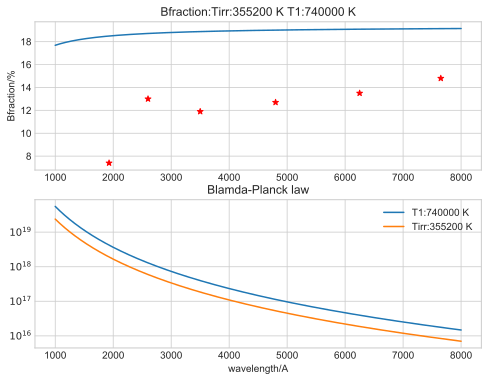

In [99]:
fig = plt.figure(figsize=(8,6))
ax1=fig.add_subplot(2,1,1)      
ax1.set_title('Bfraction:Tirr:%d K T1:%d K'%(Tirr_,T1_))
ax1.plot(waveA,rate*100)
ax1.scatter(wavelength,fraction,color='r',marker="*")
#ax1.set_xlabel("wavelength/A")
ax1.set_ylabel("Bfraction/%")
ax2=fig.add_subplot(2,1,2)
ax2.set_title("Blamda-Planck law")
ax2.plot(waveA,Blamda(lamdawave,T1_),label="T1:%d K"%T1_)
#ax2.set_label("T1:%d K"%T1_)
ax2.plot(waveA,Blamda(lamdawave,Tirr_),label="Tirr:%d K"%Tirr_)
#ax2.set_label("Tirr:%d K"%Tirr_)
ax2.set_xlabel("wavelength/A")
ax2.set_yscale('log')                           
plt.legend()
savePath=path+'T1_%d_Tirr_%d.png'%(Tirr_,T1_)
if os.path.isfile(savePath):
    os.remove(savePath) 
plt.savefig('T1_%d_Tirr_%d.png'%(T1_,Tirr_))
plt.show()
plt.close()

In [38]:
pwd

'/Users/brettlv/blog/brettlv.github.io/pythoncode/Bfraction'

In [88]:
ls *.png > png.txt

In [92]:
ls *txt

png.txt


In [103]:
import os
from PIL import Image 
import imageio
import image2gif
path='/Users/brettlv/blog/brettlv.github.io/pythoncode/Bfraction_1'
pathfile=os.listdir(path)
os.chdir(path) 
#lines=open('png.txt').readlines()
list=[]
for file in pathfile:
    if file.endswith('.png'):
        list.append(file)        
def create_gif(imagelist,gifname):
    frames=[]
    for imagename in imagelist:
        frames.append(imageio.imread(imagename))
    imageio.mimsave(gifname,frames,"GIF",duration=0.3)  
    return 

imagelist=list
gifname='gif0.3.gif' 
create_gif(imagelist,gifname)

In [80]:
#B
150000,30000
200000,36000
200000,38000
300000,48000

In [ ]:
50000,23000

In [6]:
format(1.5*1.3806505*10**-23*1.16*10**4/6.626*10**34,'.2e') #(J/K * K /J/s) 
'3.63e+14'

'3.63e+14'